<a href="https://colab.research.google.com/github/SihaoCheng/scattering_transform/blob/master/scattering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# mount google drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# import packages
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.fft

# import scattering package
import sys
# change the path below to where you download the scattering package
sys.path.append('/content/drive/MyDrive/Colab Notebooks/')
import scattering

# change the path below to where you download the data
data_dir = '/content/drive/MyDrive/Colab Notebooks/'

Mounted at /content/drive
use torch backend


In [18]:
import scattering
import importlib
importlib.reload(scattering)

<module 'scattering' from '/content/drive/MyDrive/Colab Notebooks/scattering/__init__.py'>

# 1. Analysis Examples

In [2]:
# define calculator 
# the default device is gpu. If no gpu is found, it will automatically use cpu.
# to enforce use of cpu, set device='cpu' when defining the calculator)
M = N = 256; J = 7; L = 8
st_calc = scattering.Scattering2d(M, N, J, L) 

## 1.1 one-field scattering

In [8]:
# load image (should have a shape of [N_image, N_xpix, N_ypix])
image_input = np.load(data_dir + 'H51_9.npy')[None,:M,:N]

# calculate scattering statistics (mean and correlation)
s_mean = st_calc.scattering_coef(image_input)
s_cov  = st_calc.scattering_cov (image_input)
print('size of flattened isotropic scattering (mean) coefs: ', s_mean['for_synthesis_iso'].shape)
print('size of flattened isotropic scattering correlation coefs: ', s_cov['for_synthesis_iso'].shape)
print('size of index of flattened scattering correlation coefs: ', s_cov['index_for_synthesis_iso'].shape)

size of flattened isotropic scattering (mean) coefs:  torch.Size([1, 231])
size of flattened isotropic scattering correlation coefs:  torch.Size([1, 11215])
size of index of flattened scattering correlation coefs:  torch.Size([7, 11215])


## 1.2 two-field scattering

In [ ]:
# load image (image1,2 should have a shape of [N_image, N_xpix, N_ypix])
image1 = np.load(data_dir + 'turbulence/iso/iso_u_t1z1.npy')[None,:M,:N,1,0]
image2 = np.load(data_dir + 'turbulence/iso/iso_p_t1z1.npy')[None,:M,:N,1,0]

# calculate scattering correlations, including 1-field-auto and 2-field-cross terms
s_cov_2fields = st_calc.scattering_cov_2fields(image1, image2)
print('size of isotropic scattering correlations: ', s_cov_2fields['for_synthesis_iso'].shape)
print('size of isotropic C11 coef: ', s_cov_2fields['Corr11_iso'].shape)

size of isotropic scattering correlations:  torch.Size([1, 10782])
size of isotropic C11 coef:  torch.Size([1, 4, 7, 7, 7, 4, 4])


## 1.3 other statistics (1-field)

In [ ]:
# load image (should have a shape of [N_image, N_xpix, N_ypix])
M = N = 256; J = 7; L = 4
image_input = np.load(data_dir + 'H51_9.npy')[None,:M,:N]
# alpha-scattering (cov)
ac_calc = scattering.AlphaScattering2d_cov(M, N, J, L)
# bispectrum
k_range = np.logspace(0,np.log10(M/2*1.4), J-1)
bi_calc = scattering.Bispectrum_Calculator(k_range, M, N)
# calculate estimators
alpha_cov = ac_calc.forward(image_input)
bi = bi_calc.forward(image_input)
print('size of alpha_cov coefficients: ', alpha_cov.shape)
print('size of bispectrum coefficients: ', bi.shape)

number of moments (without low-pass and harr):  44096
this chunk 0  size is  832  among  832
size of alpha_cov coefficients:  torch.Size([1, 10870])
size of bispectrum coefficients:  torch.Size([1, 35])


# 2. Synthesis Examples

### define plotting function

In [2]:
# image show
def show(image_target, image_syn, v_range=(-3, 3)):
    vmin, vmax = v_range
    for i in range(len(image_syn)):
        plt.figure(figsize=(9,3),dpi=100)
        plt.subplot(131); plt.imshow(image_target[i], vmin=vmin, vmax=vmax )
        plt.xticks([]); plt.yticks([]); plt.title('target field')
        plt.subplot(132); plt.imshow(image_syn[i], vmin=vmin, vmax=vmax )
        plt.xticks([]); plt.yticks([]); plt.title('synthesised field')
        plt.subplot(133)
        plt.hist(image_target[i].flatten(),20,(vmin,vmax),histtype='step',label='target')
        plt.hist(image_syn[i].flatten(),20,(vmin,vmax),histtype='step',label='synthesized')
        plt.legend(); plt.yscale('log'); plt.title('histogram')
        plt.show()

## 2.1 one-field, target is the texture of an image(s)

input_size:  (1, 256, 256)
# of estimators:  2927
max residual:  6.3487434 , mean residual:  0.018660009
max residual:  0.0040675625 , mean residual:  0.00014714364
time used:  34.68425393104553 s


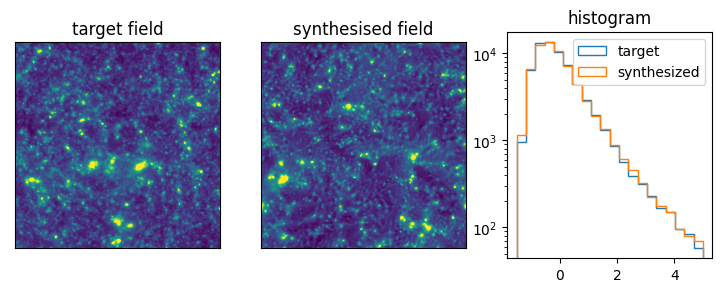

In [44]:
# load image
image_target = scattering.whiten(np.load(data_dir + 'H_51.npy')[:1,:256,:256])
# synthesize
image_syn = scattering.synthesis('s_cov_iso', image_target, seed=0)
# show
show(image_target, image_syn, (-1.5, 5))

## 2.2 image synthesis with threshold-clipping

In [5]:
# load image
image_target = scattering.whiten(np.load(data_dir + 'H_51.npy')[:1,:256,:256])

# analysis
M = N = 256; J = 7; L = 4
st_calc = scattering.Scattering2d(M, N, J, L) 
s_cov  = st_calc.scattering_cov (image_target)
coef = s_cov['for_synthesis_iso']
index_type, j1, j2, j3, l1, l2, l3 = s_cov['index_for_synthesis_iso']

# Fourier transform for l2-l1 and l3-l1
C01_f = torch.fft.fft(coef[:,index_type==3].reshape(-1,L) +
                      coef[:,index_type==4].reshape(-1,L) * 1j)
C11_f =torch.fft.fft2(coef[:,index_type==5].reshape(-1,L,L) +
                      coef[:,index_type==6].reshape(-1,L,L) * 1j)
# set threshold 
epsilon = 1e-1
select1 = C01_f.abs() > epsilon
select2 = C11_f.abs() > epsilon

def s_cov_iso_cut(s_cov, param_list):
    '''
    this can be any function that eats the s_cov from scattering.s_cov()
    and some other parameters, and then outputs a torch tensor with
    size [N_image, -1]. (I need to check my code to see if an output as 
    a completely flattened tensor is valid)
    '''
    L = param_list[0]
    coef = s_cov['for_synthesis_iso']
    index_type, j1, l1, j2, l2, j3, l3 = s_cov['index_for_synthesis_iso']
    
    # Fourier transform for l2-l1 and l3-l1
    C01_f = torch.fft.fft(coef[:,index_type==3].reshape(-1,L) +
                          coef[:,index_type==4].reshape(-1,L) * 1j)
    C11_f =torch.fft.fft2(coef[:,index_type==5].reshape(-1,L,L) +
                          coef[:,index_type==6].reshape(-1,L,L) * 1j)
    return torch.cat((
            coef[:,index_type<3], # mean, P, S1
            (C01_f[param_list[1]].reshape(len(coef),-1)).real,
            (C01_f[param_list[1]].reshape(len(coef),-1)).imag,
            (C11_f[param_list[2]].reshape(len(coef),-1)).real,
            (C11_f[param_list[2]].reshape(len(coef),-1)).imag,
        ), dim=-1)
    
# synthesize
image_syn = scattering.synthesis('s_cov_func', image_target, seed=0, 
    s_cov_func=s_cov_iso_cut, s_cov_func_params=[L, select1, select2])

input_size:  (1, 256, 256)
# of estimators:  153
max residual:  6.3487434 , mean residual:  0.33998805
max residual:  9.23872e-07 , mean residual:  1.6636835e-07
time used:  36.987300157547 s


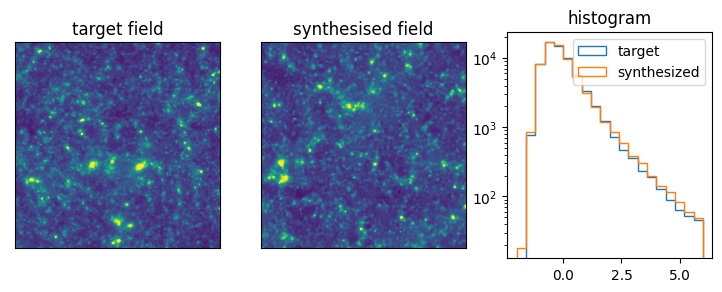

In [4]:
# show
show(image_target, image_syn, (-2, 6))

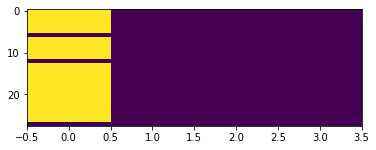

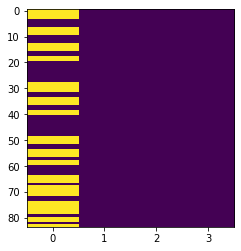

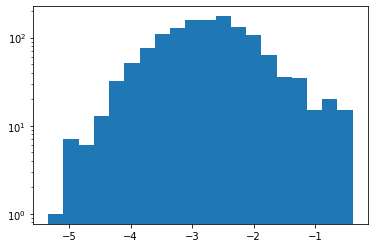

In [44]:
plt.imshow(select1.abs().cpu(), aspect=0.05, interpolation='none')
plt.show()
plt.imshow(select2[:,0,:].abs().cpu(), aspect=0.05, interpolation='none')
plt.show()
plt.hist(C11_f.abs().flatten().cpu().log10(),20)
plt.yscale('log')
plt.show()

In [ ]:
lensing
1e-5 2925
1e-3 1943
1e-2  613
1e-1  153

cosmic web
1e-5 2923
1e-3 1923
1e-2  617
1e-1   57

turbulence
1e-5 2921
1e-3 2107
1e-2  921
1e-1   63

## 2.3 use a subset of coefficients for synthesis

In [42]:
# load image
image_target1 = np.load(data_dir + 'H_51.npy')[:1,:256,:256]
image_target2 = np.log(np.load(data_dir + 'H81_0_Quijote.npy')[None,:256,:256]+1)
image_target3 = np.load(data_dir + 'turbulence/iso/iso_u_t1z1.npy')[None,:,:,1,0]
image_target4 = np.load(data_dir + 'turbulence/iso/iso_p_t1z1.npy')[None,:,:,1,0]
for level in range(2):
    image_target3 = scattering.binning2x2(image_target3)
    image_target4 = scattering.binning2x2(image_target4)
image_target5 = np.load(data_dir + 'turbulence/iso/iso_u_t1z1.npy')[None,:512,:512,1,0]
image_target6 = np.load(data_dir + 'turbulence/iso/iso_p_t1z1.npy')[None,:512,:512,1,0]
for level in range(1):
    image_target5 = scattering.binning2x2(image_target5)
    image_target6 = scattering.binning2x2(image_target6)

image_target = scattering.whiten(scattering.remove_slope(np.concatenate(
    (image_target1, image_target2, image_target3, image_target4, 
     image_target5, image_target6), axis=0)))

def s_cov_iso_cut(s_cov, param_list):
    coef = s_cov['for_synthesis_iso']
    index_type, j1, j2, j3, l1, l2, l3 = s_cov['index_for_synthesis_iso']
    
    return torch.cat((
            coef[:,index_type==0], # mean
            coef[:,index_type==1], # P
            # coef[:,index_type==2], # S1
            coef[:,index_type==3], # C01re
            coef[:,index_type==4], # C01im
            coef[:,index_type==5], # C11re
            coef[:,index_type==6], # C11im
        ), dim=-1)
    
# synthesize
image_syn = scattering.synthesis('s_cov_func', image_target, seed=0, 
    s_cov_func=s_cov_iso_cut, s_cov_func_params=[L, select1, select2])

input_size:  (6, 256, 256)
# of estimators:  2920
max residual:  8.35264 , mean residual:  0.015583181
max residual:  0.012545258 , mean residual:  0.00023258709
time used:  45.41839933395386 s


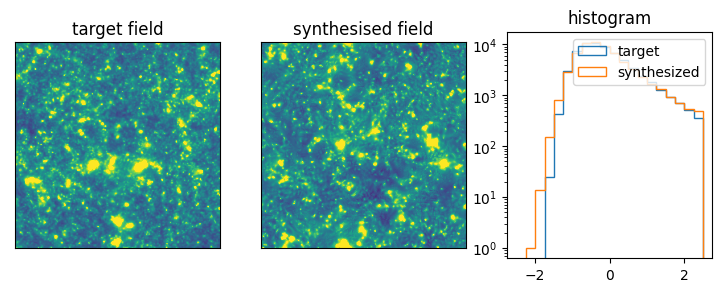

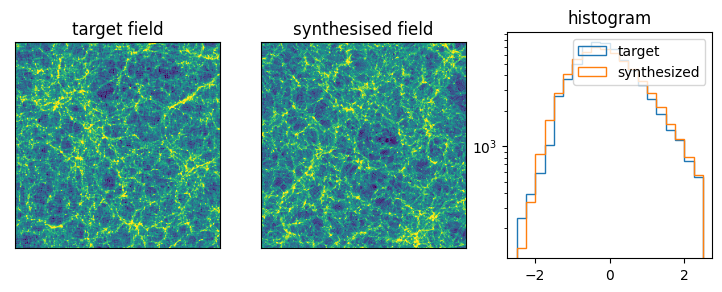

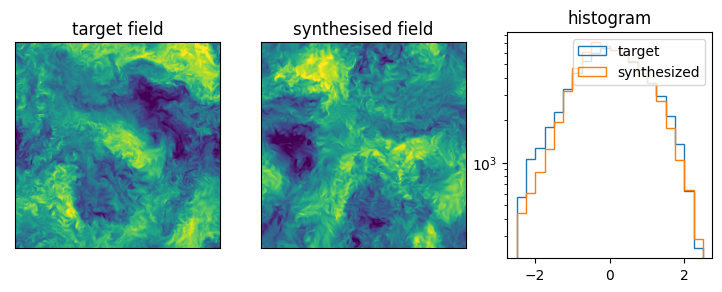

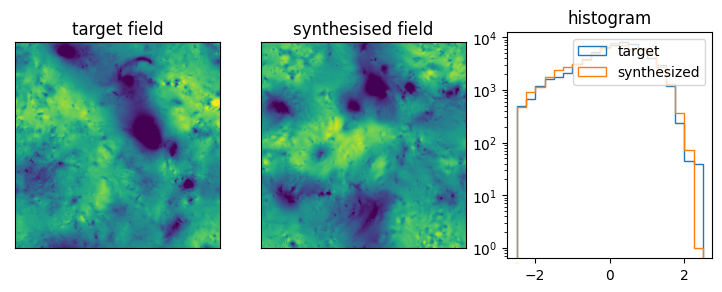

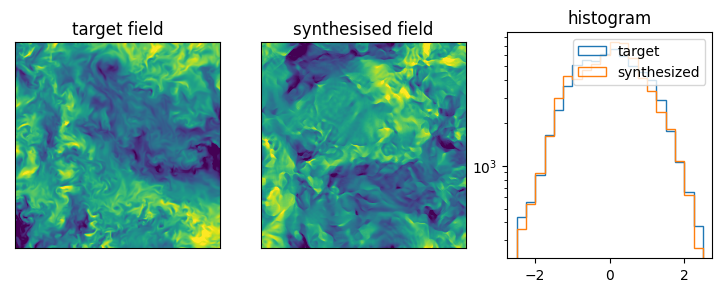

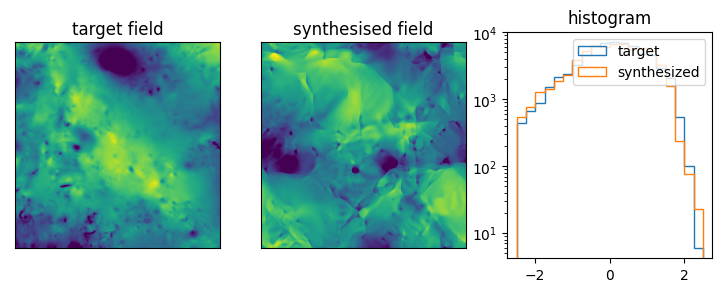

In [44]:
show(image_target, image_syn, (-2.5, 2.5))

## 2.2 one-field, target is the value of coefs

### example 1: interpolation between textures

In [46]:
# load two images
M = N = 256; J = 7; L = 4
image_target1 = scattering.whiten(np.log(np.load(data_dir + 'H81_0_Quijote.npy')[None,:M,:N]+1))
image_target2 = scattering.whiten(np.load(data_dir + 'H_51.npy').astype(np.float32)[:1,:M,:N])

# calculate scattering correlations coefficients for each of them
st_calc = scattering.Scattering2d(M, N, J, L)
s_cov1 = st_calc.scattering_cov(image_target1)
s_cov2 = st_calc.scattering_cov(image_target2)

# linearly interpolate the coefficients between image1 and image2
coef_target_list = []
param_list = [0.75, 0.5, 0.25, 0.]
for factor in param_list:
    coef_target_list.append(
        factor * s_cov1['for_synthesis_iso'] + (1-factor) * s_cov2['for_synthesis_iso'])

# synthesize based on the values of interpolated coefficients
image_syn = scattering.synthesis(
    's_cov_iso', mode='estimator', M=M, N=N, J=J, L=L, 
    target=torch.cat(coef_target_list, dim=0),
    image_init=image_target1 * np.ones((len(param_list),1,1)),
    steps=200, seed=0
)

# of estimators:  2927
max residual:  1.2190745 , mean residual:  0.004900724
max residual:  0.00880507 , mean residual:  0.00015797876
time used:  27.194520235061646 s


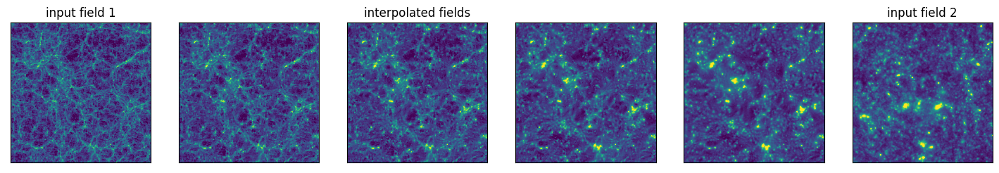

In [47]:
# plot result
plt.figure(figsize=((2+len(image_syn))*3,3),dpi=100)

plt.subplot(1,2+len(image_syn),1)
plt.imshow(image_target1[0], vmin=-1.5, vmax=5); 
plt.title('input field 1'); plt.xticks([]); plt.yticks([])

for i in range(len(image_syn)):
    plt.subplot(1,2+len(image_syn),i+2)
    plt.imshow(image_syn[i], vmin=-1.5, vmax=5)
    if i == 1: plt.title('interpolated fields'); 
    plt.xticks([]); plt.yticks([])

plt.subplot(1,2+len(image_syn),2+len(image_syn)); 
plt.imshow(image_target2[0], vmin=-1.5, vmax=5)
plt.title('input field 2'); plt.xticks([]); plt.yticks([]); plt.show()

### example 2: changing the overall amplitude of one type of coef.

In [9]:
# define calculators
M = N = 256; J = 7; L = 4
st_calc = scattering.Scattering2d(M, N, J, L)
# load image
image_input = scattering.whiten(np.log(np.load(data_dir + 'H81_0_Quijote.npy')[None,:M,:N]+1))
# image_input = scattering.whiten(np.load(data_dir + 'H51_9.npy')[None,:M,:N])
# calculate estimators
s_cov_set = st_calc.scattering_cov(image_input)
index_type, j1, l1, j2, l2, j3, l3 = s_cov_set['index_for_synthesis_iso']

In [10]:
# change the overall amplitude of C01 coefficients
s_cov_list = []
param_list1 = [-2, -1, 0, 1, 2]
for factor in param_list1:
    s_cov = s_cov_set['for_synthesis_iso']*1.
    s_cov[:,(index_type==3)+(index_type==4)] *= factor # C01_real/imag is scaled by a factor
    s_cov_list.append(s_cov)

# change the overal amplitude of C11 coefficients
param_list2 = [0.8, 1, 1.5, 2]
for factor in param_list2:
    s_cov = s_cov_set['for_synthesis_iso']*1.
    s_cov[:,(index_type==5)+(index_type==6)] *= factor # C11_real/imag is scaled by a factor
    s_cov_list.append(s_cov)

# change the overal amplitude of both C01 and C11 coefficients
param_list3 = [0.8, 1, 1.5, 2]
for factor in param_list3:
    s_cov = s_cov_set['for_synthesis_iso']*1.
    s_cov[:,(index_type==3)+(index_type==4)] *= factor**2 # C10 are scaled by factor**0.5
    s_cov[:,(index_type==5)+(index_type==6)] *= factor # C11 are scaled by a factor
    s_cov_list.append(s_cov)

# synthesize based on values of coefficients
N_image = len(param_list1) + len(param_list2) + len(param_list3)
image_syn = scattering.synthesis(
    's_cov_iso', mode='estimator', M=M, N=N, J=J, L=L,
    target=torch.cat(s_cov_list, dim=0), 
    image_init=image_input * np.ones((N_image,1,1))
)

# of estimators:  2927
max residual:  0.2412923 , mean residual:  0.0011801118
max residual:  0.088100314 , mean residual:  0.0005062636
time used:  63.531776666641235 s


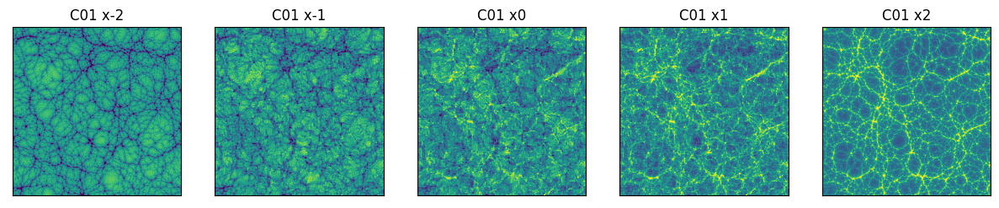

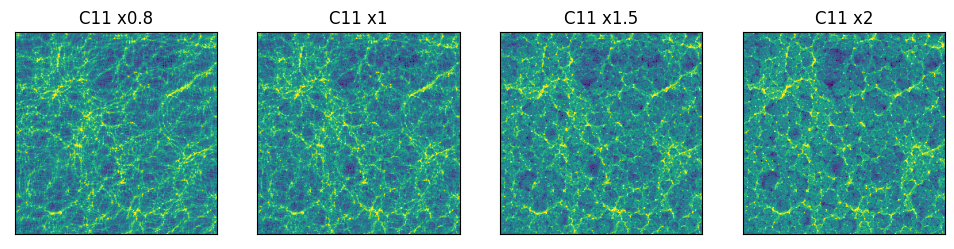

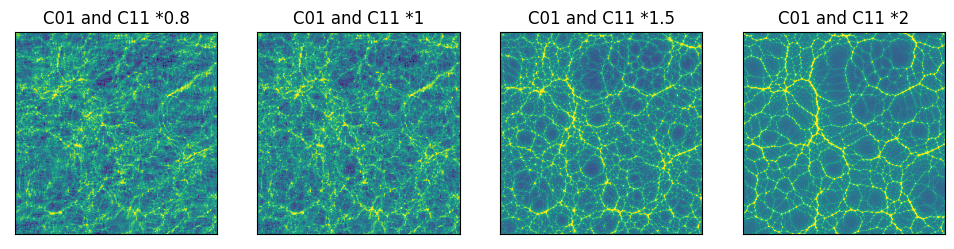

In [12]:
# plot result
start_index = [0, len(param_list1), len(param_list1)+len(param_list2)]
name_list = [['C01 x' for i in range(len(param_list1))],
            ['C11 x' for i in range(len(param_list2))],
            ['C01 and C11 *' for i in range(len(param_list3))]]

for list_index, param_list in enumerate([param_list1, param_list2, param_list3]):
    plt.figure(figsize=(len(param_list)*3,3), dpi=100)
    for i in range(len(param_list)):
        plt.subplot(1, len(param_list), i+1)
        plt.imshow(image_syn[i+start_index[list_index]], vmin=-3, vmax=3)
        plt.title(name_list[list_index][i] + str(param_list[i])); plt.xticks([]); plt.yticks([])
    plt.show()

### changing orientation amplitude

In [ ]:
# define calculators
M = N = 256; J = 7; L = 4
st_calc = scattering.Scattering2d(M, N, J, L)

# load image
image_input = scattering.whiten(np.log(np.load(data_dir + 'H81_0_Quijote.npy')[None,:M,:N]+1))
# image_input = scattering.whiten(np.load(data_dir + 'H51_9.npy')[None,:M,:N])

# calculate estimators
s_cov_set = st_calc.scattering_cov(image_input)
index_type, j1, l1, j2, l2, j3, l3 = s_cov_set['index_for_synthesis_iso']

# of estimators:  2927
max residual:  0.17195559 , mean residual:  0.0020406947
max residual:  0.07272935 , mean residual:  0.00082177354
time used:  89.27300238609314 s


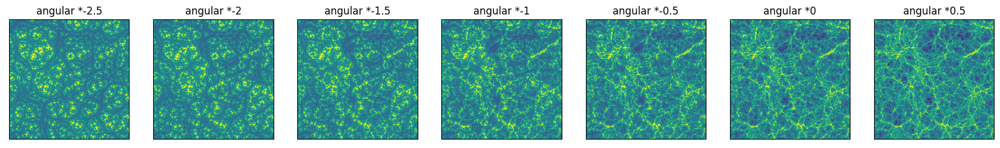

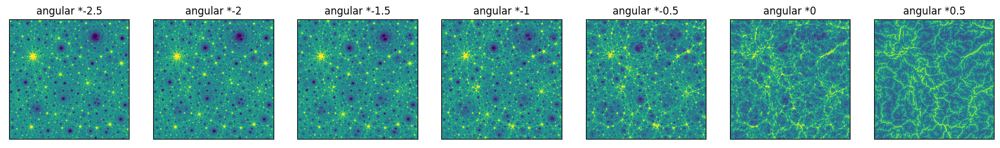

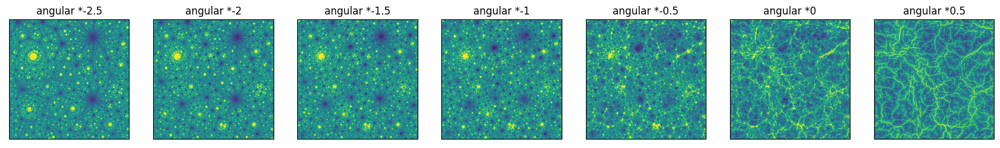

# of estimators:  2927
max residual:  0.08968302 , mean residual:  0.0010009484
max residual:  0.025219444 , mean residual:  0.00044086212
time used:  89.21739840507507 s


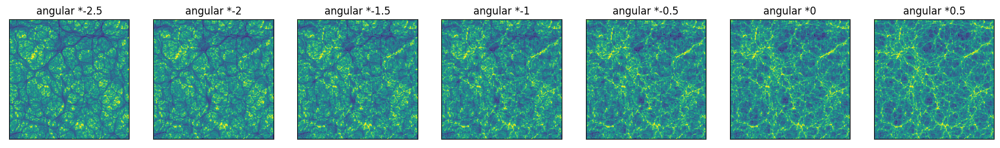

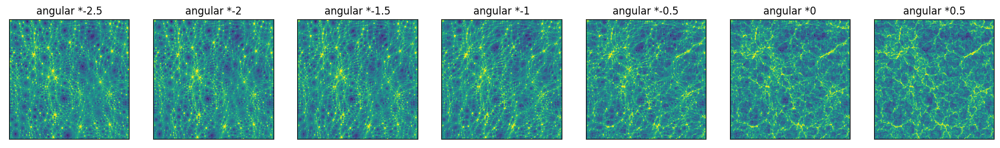

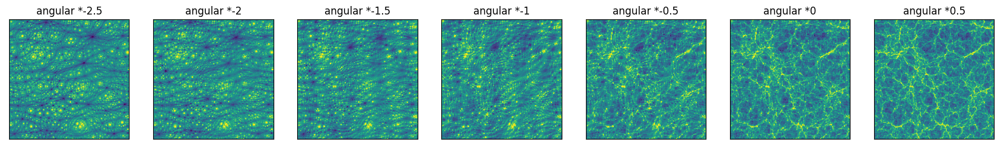

In [ ]:
# change the orientation amplitude of C01 and C11 (keep the l1=l2=l3 coef)
# change the orientation amplitude of C01 and C11 (keep the mean)
for keep_para in [True, False]:
    s_cov_list = []
    param_list1 = [-2.5, -2, -1.5, -1, -0.5, 0, 0.5]
    for factor in param_list1:
        s_cov = scattering.modify_angular(s_cov_set, factor, C01=True, keep_para=keep_para)
        s_cov_list.append(s_cov)

    param_list2 = [-2.5, -2, -1.5, -1, -0.5, 0, 0.5]
    for factor in param_list2:
        s_cov = scattering.modify_angular(s_cov_set, factor, C11=True, keep_para=keep_para)
        s_cov_list.append(s_cov)

    param_list3 = [-2.5, -2, -1.5, -1, -0.5, 0, 0.5]
    for factor in param_list3:
        s_cov = scattering.modify_angular(s_cov_set, factor, C01=True, C11=True, keep_para=keep_para)
        s_cov_list.append(s_cov)

    # synthesize based on values of coefficients
    N_image = len(param_list1) + len(param_list2) + len(param_list3)
    image_syn = scattering.synthesis(
        's_cov_iso', mode='estimator', M=M, N=N, J=J, L=L,
        target=torch.cat(s_cov_list, dim=0), 
        image_init=image_input * np.ones((N_image,1,1))
    )
    # plot
    start_index = [0, len(param_list1), len(param_list1)+len(param_list2)]
    for list_index, param_list in enumerate([param_list1, param_list2, param_list3]):
        plt.figure(figsize=(len(param_list)*3,3), dpi=100)
        for i in range(len(param_list)):
            plt.subplot(1,len(param_list),i+1)
            plt.imshow(image_syn[i+start_index[list_index]], vmin=-3, vmax=3)
            plt.title('angular *'+str(param_list[i])); plt.xticks([]); plt.yticks([])
        plt.show()

### draft

In [ ]:
# L = 4
# coef = s_cov['for_synthesis_iso']
# index_type, j1, l1, j2, l2, j3, l3 = s_cov['index_for_synthesis_iso']

# C01re_f = torch.fft.rfft(coef[:,index_type==3].reshape(-1,L))
# select1 = C01re_f.abs() > 1e-5
# C01im_f = torch.fft.rfft(coef[:,index_type==4].reshape(-1,L))
# select2 = C01im_f.abs() > 1e-5
# C11re_f = torch.fft.rfft2(coef[:,index_type==5].reshape(-1,L,L))
# select3 = C11re_f.abs() > 1e-5
# C11im_f = torch.fft.rfft2(coef[:,index_type==6].reshape(-1,L,L))
# select4 = C11im_f.abs() > 1e-5

# return torch.cat((
#     (coef[:,index_type<3]),
#     (C01re_f.select1.real,
#     (C01re_f.reshape(len(coef),-1)).imag,
#     (C01im_f.reshape(len(coef),-1)).real,
#     (C01im_f.reshape(len(coef),-1)).imag,
#     (C11re_f.reshape(len(coef),-1)).real,
#     (C11re_f.reshape(len(coef),-1)).imag,
#     (C11im_f.reshape(len(coef),-1)).real,
#     (C11im_f.reshape(len(coef),-1)).imag,
# ), dim=-1)

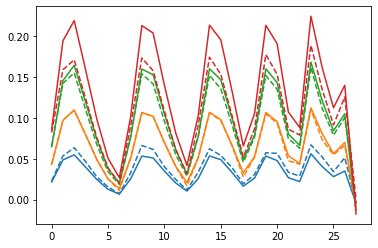

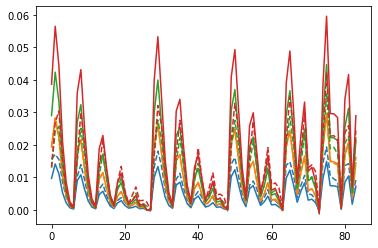

In [ ]:
# check convergence (solid/dashed lines are target coef / coef of synthesized images)
s_cov_syn = st_calc.scattering_cov(image_syn, flatten=True)
coef_syn = s_cov_syn['for_synthesis_iso'].cpu()

for i in range(len(param_list)):
    plt.plot(coef_target[i,index_type==3].reshape(-1,4)[:,0], color='C'+str(i), ls='-')
    plt.plot(coef_syn[i,index_type==3].reshape(-1,4)[:,0], color='C'+str(i), ls='--')
plt.show()

for i in range(len(param_list)):
    plt.plot(coef_target[i,index_type==5].reshape(-1,4,4)[:,0,0], color='C'+str(i), ls='-')
    plt.plot(coef_syn[i,index_type==5].reshape(-1,4,4)[:,0,0], color='C'+str(i), ls='--')
plt.show()

## 2.3 two fields, image target

In [ ]:
# load image
image_target = np.load(data_dir + 'turbulence/iso/iso_u_t1z1.npy')[None,:,:,1,0]
image_b      = np.load(data_dir + 'turbulence/iso/iso_p_t1z1.npy')[None,:,:,1,0]

# 2x2 binning (make the images smaller)
for level in range(2):
    image_target = scattering.binning2x2(image_target)
    image_b      = scattering.binning2x2(image_b)

# synthesize
image_syn = scattering.synthesis(
    's_cov_2fields_iso', mode='image', 
    target=image_target, image_b=image_b, image_init='random phase',
    steps=800, learning_rate=0.5, seed=0,
)

input_size:  (1, 256, 256)
# of estimators:  8086
max residual:  0.28264487 , mean residual:  0.002795604
max residual:  0.00022033788 , mean residual:  1.34883885e-05
time used:  198.69255828857422 s


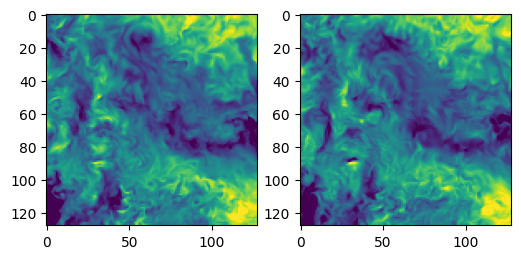

In [ ]:
# s_cov_iso, step=800, 199s, t1z1, P00, from GRF, 0.5
plt.figure(figsize=(6,3),dpi=100)
plt.subplot(121); plt.imshow(image_target[0,:128,:128], vmin=-1, vmax=1)
plt.subplot(122); plt.imshow(image_syn   [0,:128,:128], vmin=-1, vmax=1)
plt.show()

### synthesis results with other settings

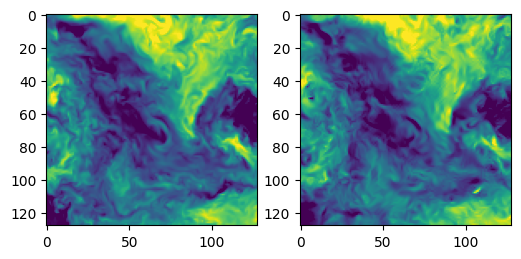

In [ ]:
# s_cov_iso, step=800, 308s, t501z1, P00, from GRF, another field

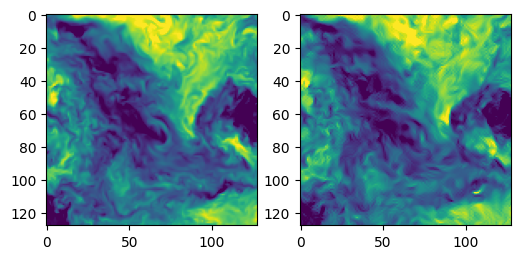

In [ ]:
# s_cov_iso, step=800, 308s, t501z1, P00, from WN, 0.5

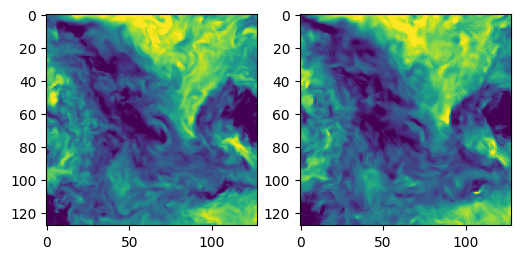

In [ ]:
# s_cov_iso, step=800, 299s, t501z1, P00, from WN, 0.2

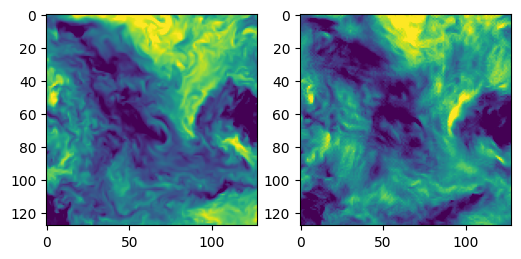

In [ ]:
# s_cov_iso, step=800, 300s, t501z1, P11, from WN, 0.2

### for comparison: single field synthesis

input_size:  (1, 256, 256)
# of estimators:  2927
max residual:  0.1281147 , mean residual:  0.0022877108
max residual:  0.001979753 , mean residual:  0.0001225402
time used:  35.297701835632324 s


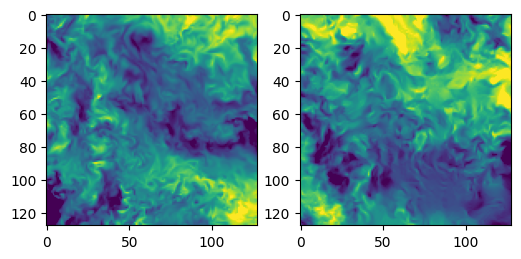

In [ ]:
# load image
image_target = np.load(data_dir + 'turbulence/iso/iso_u_t1z1.npy')[None,:,:,1,0]
image_b      = np.load(data_dir + 'turbulence/iso/iso_p_t1z1.npy')[None,:,:,1,0]

# 2x2 binning (make the images smaller)
for level in range(2):
    image_target = scattering.binning2x2(image_target)
    image_b      = scattering.binning2x2(image_b)

# s_cov_iso single field
image_syn = scattering.synthesis('s_cov_iso', image_target, image_init='random phase', seed=0)
# plot
plt.figure(figsize=(6,3),dpi=100)
plt.subplot(121); plt.imshow(image_target[0,:128,:128], vmin=-1, vmax=1)
plt.subplot(122); plt.imshow(image_syn   [0,:128,:128], vmin=-1, vmax=1)
plt.show()

# draft

In [3]:
image_input = np.load(data_dir + 'H51_9.npy')[None,:M,:N]
s_cov_list = []
for L in [3,4,6,8,12,16]:
    M = N = 256; J = 7
    st_calc = scattering.Scattering2d(M, N, J, L)
    s_cov_list.append(st_calc.scattering_cov (image_input))

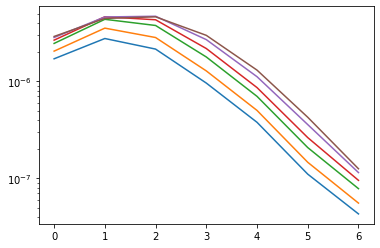

In [ ]:
L_list = [3,4,6,8,12,16]
for i in range(len(s_cov_list)):
    plt.plot(s_cov_list[i]['P11_iso'].mean(-1).cpu()[0,0]*L_list[i]**2)
plt.yscale('log')
plt.show()

input_size:  (1, 256, 256)
# of estimators:  799
max residual:  5.148764 , mean residual:  0.0383493
max residual:  0.00027876312 , mean residual:  2.9828218e-05
time used:  28.935681104660034 s


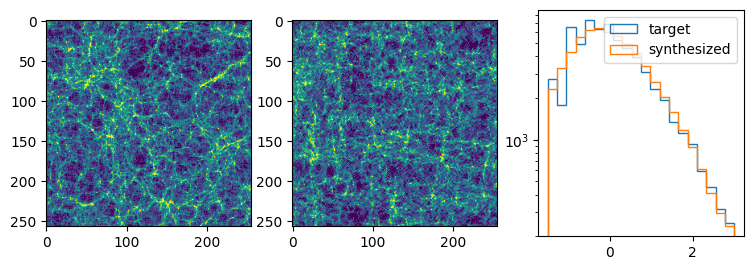

input_size:  (1, 256, 256)
# of estimators:  2927
max residual:  5.432824 , mean residual:  0.01190131
max residual:  0.005841363 , mean residual:  0.0001272859
time used:  35.29240798950195 s


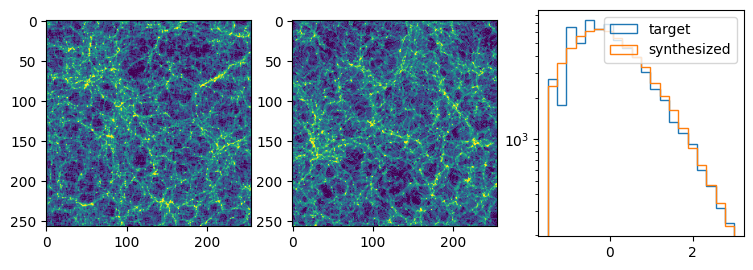

input_size:  (1, 256, 256)
# of estimators:  239
max residual:  5.432823896408081 , mean residual:  0.14535419789859108
max residual:  2.407241798996966e-05 , mean residual:  1.4953672470417094e-06
time used:  25.806398391723633 s


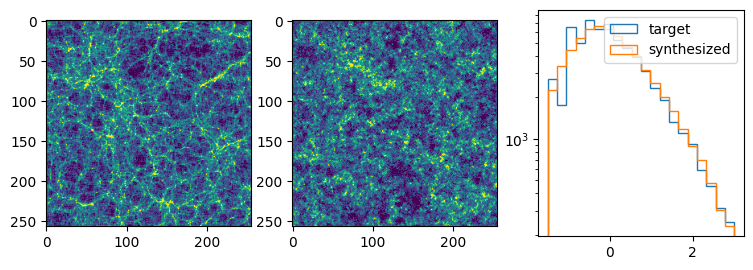

input_size:  (1, 256, 256)
# of estimators:  1597
max residual:  5.43282413482666 , mean residual:  0.04789685736922787
max residual:  0.002718687057495117 , mean residual:  7.617998356138496e-05
time used:  27.932393789291382 s


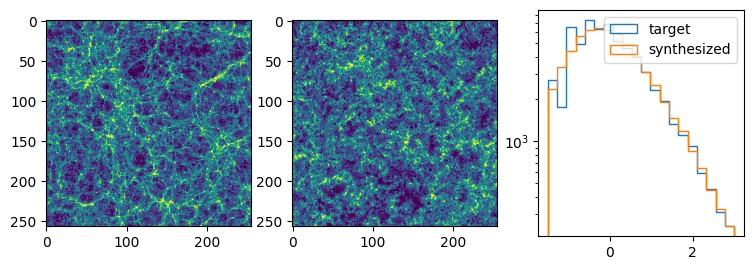

input_size:  (1, 256, 256)
# of estimators:  5083
max residual:  5.43282413482666 , mean residual:  0.02487826124937668
max residual:  0.004598585035112904 , mean residual:  0.0002197977564154229
time used:  29.488336324691772 s


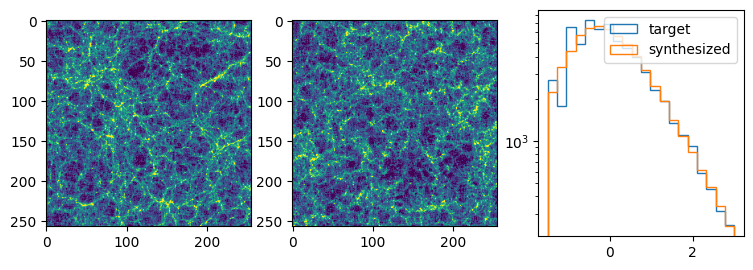

input_size:  (1, 256, 256)
# of estimators:  11705
max residual:  5.43282413482666 , mean residual:  0.01629723058083974
max residual:  0.03064379096031189 , mean residual:  0.0006195924793912382
time used:  31.413893699645996 s


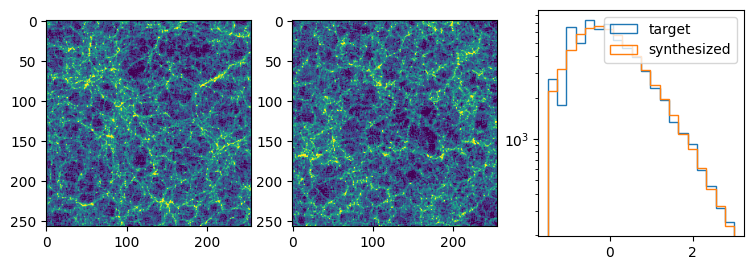

In [42]:
# load image
M = N = 256

image_target = np.load(data_dir + 'turbulence/iso/iso_u_t1z1.npy')[None,:,:,1,0]
# image_b      = np.load(data_dir + 'turbulence/iso/iso_p_t1z1.npy')[None,:,:,1,0]

# 2x2 binning (make the images smaller)
for level in range(2):
    image_target = scattering.binning2x2(image_target)
    # image_b      = scattering.binning2x2(image_b)

# image_target = scattering.whiten(np.load(data_dir + 'H_51.npy')[:1,:256,:256])
image_target = scattering.whiten(np.log(np.load(data_dir + 'H81_0_Quijote.npy')[None,:M,:N]+1))

for L in [2,4]:# synthesize
    image_syn = scattering.synthesis('s_cov_iso', image_target, seed=0, wavelets='gau', L=L,
                                    #  image_init='random phase', learning_rate=0.5
                                     )
    # show
    show(image_target, image_syn, (-1.5, 3))

for L in [1,2,3,4]:# synthesize
    image_syn = scattering.synthesis('s_cov', image_target, seed=0, wavelets='gau_harmonic', L=L,
                                    #  image_init='random phase', learning_rate=0.5
                                     )
    # show
    show(image_target, image_syn, (-1.5, 3))

In [11]:
M = 255; N = 255; J = 7; L = 5
st_calc = scattering.Scattering2d(M, N, J, L, wavelets='gau_harmonic')

image_input = np.load(data_dir + 'H51_9.npy')[None,:M,:N]

In [5]:
def half2full(filters_set):
    M, N = filters_set.shape[-2:]
    temp = torch.fft.fftshift(filters_set, dim=(-2,-1))
    temp_flip = torch.flip(temp, dims=(-2,-1)).roll(M%2-1,-2).roll(N%2-1,-1)
    temp = torch.cat((temp, temp_flip), dim=-3)
    temp = torch.fft.ifftshift(temp, dim=(-2,-1))
    return temp

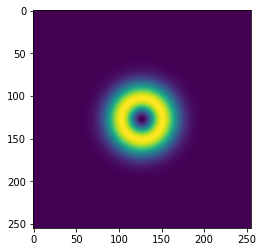

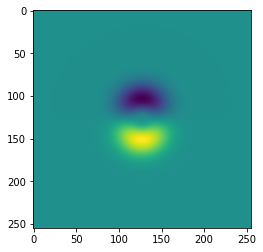

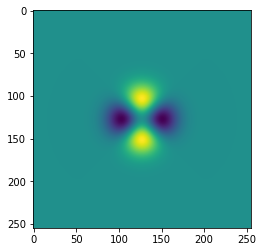

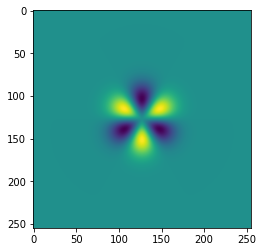

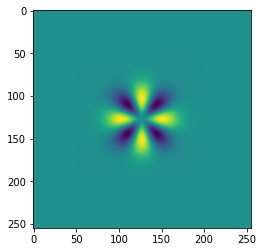

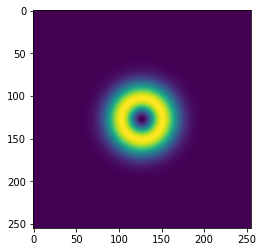

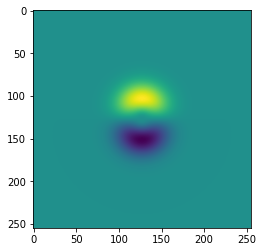

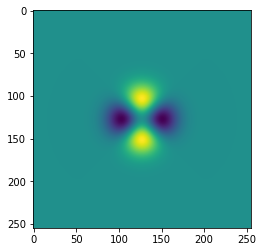

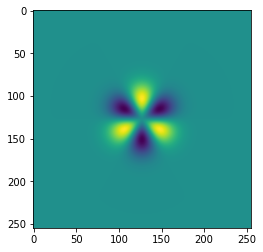

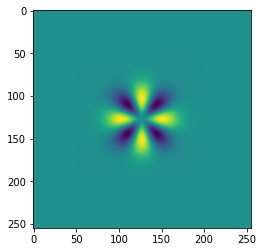

In [12]:
filter = half2full(st_calc.filters_set.cpu())
# filter_harmonic = torch.fft.fftn(filter, dim=-3)
for i in range(L*2):
    plt.imshow(torch.fft.fftshift(
        # torch.fft.ifftn(
            # filter_harmonic[1,i], 
            filter[2,i], 
            # dim=(-2,-1))
        ).real
    )
    plt.show()
    # plt.imshow(torch.fft.fftshift(filter_harmonic[1,i].real)); plt.show()
    # plt.imshow(torch.fft.fftshift(filter_harmonic[1,i].imag)); plt.show()